In [1]:
import os
import json
import h5py
import zarr
import numpy as np
import pandas as pd
import xarray as xr

import cartopy.crs as ccrs
import cartopy.feature as cfeature

import matplotlib.colors as mcolors
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.patches as mpatches
import matplotlib.ticker as tck
from matplotlib.gridspec import GridSpec
from matplotlib.ticker import MaxNLocator

from glob import glob
from datetime import datetime
from tqdm.notebook import tqdm

%config InlineBackend.figure_format = 'retina'
%load_ext autoreload
%autoreload 2

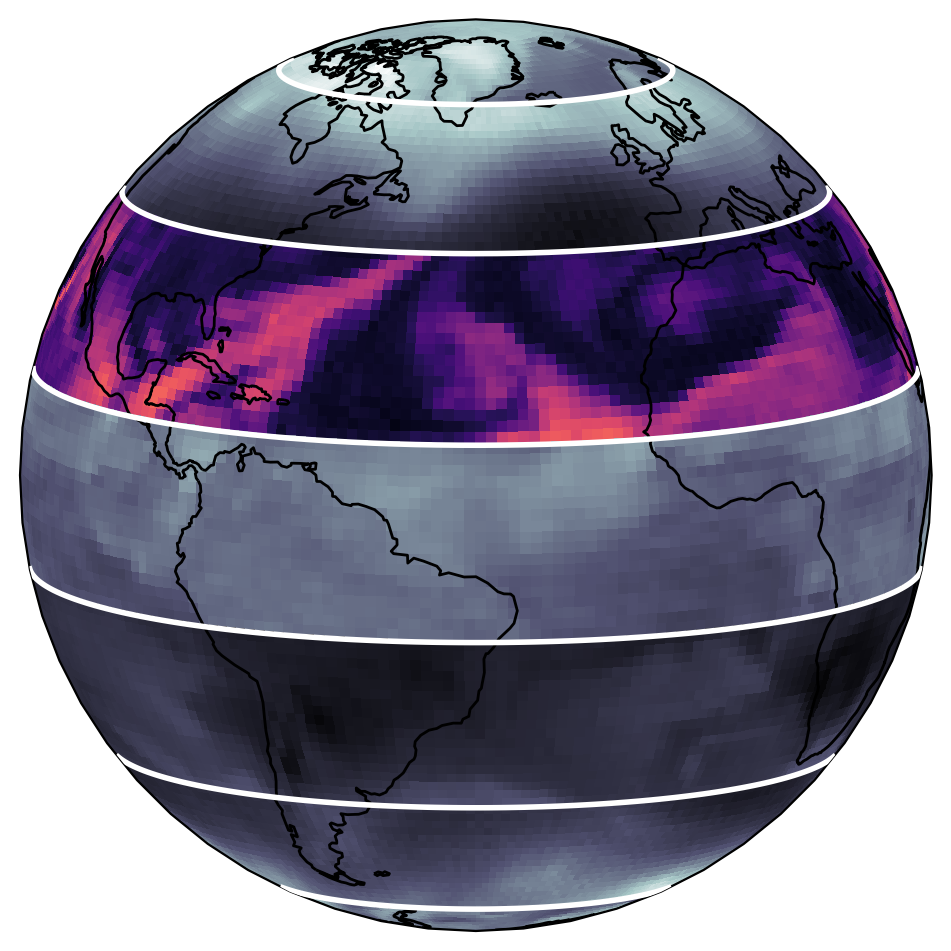

2020-01-01T00:00:00.000000000


In [571]:
ds = xr.open_zarr(
    '/home/jstock/sf/prod/swift/results/era5-swinv2-1.4-scm'
    '/011/output/checkpoint-020000/output-1i-90s-1m-24h.zarr',
    decode_timedelta=False, mask_and_scale=False
)
# ds = xr.open_zarr(
#     '/home/jstock/sf/prod/swift/results/era5-swinv2-1.4-scm'
#     '/011/output/checkpoint-020000/output-64i-60s-12m-6h.zarr',
#     decode_timedelta=False, mask_and_scale=False
# )

var_specs = [
    {"name": "2m_temperature",          "cmap": "bone_r"},
    {"name": "geopotential",            "cmap": "bone_r", "level": 7},
    {"name": "specific_humidity",       "cmap": "magma", "level": 9},
    {"name": "10m_v_component_of_wind", "cmap": "bone_r"},
    {"name": "temperature",             "cmap": "bone_r", "level": 10},
    {"name": "mean_sea_level_pressure", "cmap": "bone_r"},
    {"name": "10m_u_component_of_wind", "cmap": "bone_r"},
]

lats, lons = ds["latitude"].values, ds["longitude"].values

nlat = len(lats)
height = nlat // len(var_specs)

deltas = [45]
initial = 0
fig = plt.figure(figsize=(10, 10))
for i in range(1):
    common_idx = dict(time=initial, number=0, prediction_timedelta=deltas[i])

    ax = plt.subplot(1, 2, i+1, projection=ccrs.Orthographic(
        central_longitude=320,
        central_latitude=10
    ))
    ax.set_global()
    ax.coastlines(color="black", linewidth=1)

    edges = []
    for i, spec in enumerate(var_specs):
        idxer = dict(common_idx)
        if "level" in spec:
            idxer["level"] = spec["level"]
        da = ds[spec["name"]].isel(**idxer)

        data = da.values
        start = nlat - (i + 1) * height
        end   = nlat - i * height
        band  = slice(start, end)
        edges.append(start)

        lat_band = lats[band]
        data_band = data[band, :]

        im = ax.pcolormesh(
            lons,
            lat_band,
            data_band,
            transform=ccrs.PlateCarree(),
            cmap=spec["cmap"],
            norm=mcolors.Normalize(
                vmin=np.nanmin(data), vmax=np.nanmax(data)
            ),
            shading="auto",
        )

    full_lons = np.concatenate([lons, [360]])
    for idx in edges:
        ax.plot(
            full_lons,
            np.full_like(full_lons, lats[idx]-1),
            transform=ccrs.PlateCarree(),
            color="white",
            linewidth=2,
            zorder=10,
        )

fig.subplots_adjust(
    left=0.01,
    right=0.99,
    top=1.0,
    bottom=0.0,
    wspace=0.15
)
# fig.savefig(f"cover-{deltas[0]}.png", dpi=300, bbox_inches="tight")
plt.show()

print(ds["time"].isel(time=initial).values)

=> file saved to u850_anomaly_2020-01-10.png


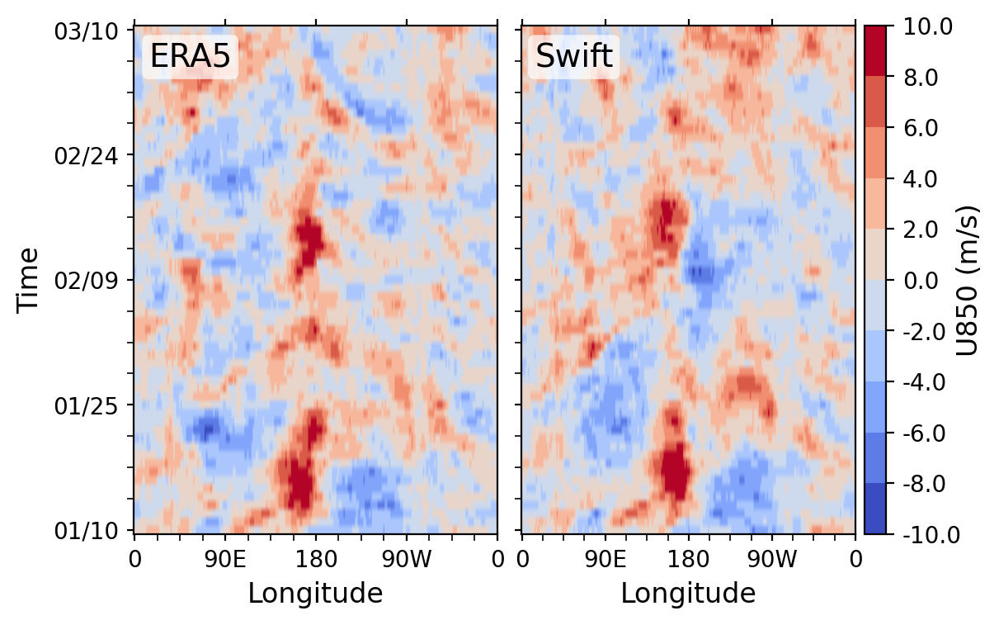

In [13]:
def get_era5(variable, level, initial, lat_south=-5.0, lat_north=5.0, steps=75):
    climatology = xr.open_zarr(
        "gs://weatherbench2/datasets/era5-hourly-climatology/1990-2019_6h_1440x721.zarr"
    )[variable].mean(dim="hour").isel(level=level)

    ds = xr.open_zarr(
        '/home/jstock/sf/data/wb2/1.40625deg_6hr_test.zarr', decode_timedelta=True, mask_and_scale=False
    )
    climatology = climatology.interp(longitude=ds.longitude, latitude=ds.latitude, method="linear")

    ds = ds[variable].isel(level=level)
    ds = ds.isel(time=ds.time.dt.hour == 0)
    ds = ds.sel(time=slice(initial, initial + np.timedelta64(steps, 'D')))

    # anomaly
    data = ds - climatology.sel(dayofyear=ds.time.dt.dayofyear)
    data = data.sel(latitude=slice(lat_south, lat_north)).mean(dim='latitude').values
    # data = data.resample(time="6h").interpolate("linear").values # assume 6h
    lon = ds["longitude"].values
    times = ds["time"].values
    return data, lon, times
    

def get_data(variable, level, initial, lat_south=-5.0, lat_north=5.0, steps=75):
    climatology = xr.open_zarr(
        "gs://weatherbench2/datasets/era5-hourly-climatology/1990-2019_6h_1440x721.zarr"
    )[variable].mean(dim="hour").isel(level=level)

    ds = xr.open_zarr(
        # "/home/jstock/sf/prod/swift/results/era5-swinv2-1.4-scm/011/output/checkpoint-020000/output-1i-90s-1m-24h.zarr", 
        "/home/jstock/sf/prod/swift/results/era5-swinv2-1.4-scm/011/output/checkpoint-020000/output-32i-75s-12m-24h.zarr", 
        decode_timedelta=True, mask_and_scale=False
    )
    climatology = climatology.interp(longitude=ds.longitude, latitude=ds.latitude, method="linear")

    ds = ds[variable].isel(level=level, number=0)
    ds = ds.assign_coords(
        dayofyear=(ds["time"] + ds["prediction_timedelta"]).dt.dayofyear
    ).sel(time=initial).isel(prediction_timedelta=slice(0, steps))

    # anomaly
    data = ds.groupby("dayofyear") - climatology
    data = data.sel(latitude=slice(lat_south, lat_north)).mean(dim='latitude').values
    lon = ds["longitude"].values
    times = ds["time"].values + ds["prediction_timedelta"].values
    
    return data, lon, times


def hovmoller(pred, era5, lon, times, filename=None):
    fontsize = 12

    fig = plt.figure(figsize=(6, 4))
    gs = gridspec.GridSpec(nrows=1, ncols=3, width_ratios=[1, 0.92, 0.06], wspace=0.1)

    ax0 = fig.add_subplot(gs[0])
    ax1 = fig.add_subplot(gs[1], sharex=ax0)

    vmin, vmax = -10, 10
    bounds = np.linspace(vmin, vmax, 11)
    ticklabels = [f"{b}" for b in bounds]

    norm = plt.cm.colors.BoundaryNorm(boundaries=bounds, ncolors=256, clip=True)
    ax0.imshow(era5, norm=norm, cmap='coolwarm')
    im = ax1.imshow(pred, norm=norm, cmap='coolwarm')

    # Set up x-axis ticks and labels.
    xlabels = ["0", "90E", "180", "90W", "0"]
    #  xlabels = ["0", "60E", "120E", "180", "120W", "60W", "0"]
    xvalues = np.linspace(0, len(lon), len(xlabels))
    ys = np.linspace(0, pred.shape[0] - 1, 5)
    formatted = [datetime.utcfromtimestamp(dt.astype("datetime64[s]").astype(int)).strftime("%m/%d")
                 for dt in times]
    ylabels = [formatted[int(t)] for t in ys]
    ylabels[-1] = formatted[-1]
    for i, ax in enumerate([ax0, ax1]):
        ax.set_xticks(xvalues)
        ax.set_xticklabels(xlabels, fontsize=fontsize - 2)
        ax.set_xlabel("Longitude", fontsize=fontsize)
        ax.tick_params(axis="x", top=True, labeltop=False)
        ax.xaxis.set_minor_locator(tck.AutoMinorLocator())
        ax.set_aspect("auto")
        ax.invert_yaxis()
            # Set up y-axis ticks and labels on the left axis.
    
        ax.set_yticks(ys)
        if i == 0:
            ax.set_yticklabels(ylabels, fontsize=fontsize - 2)
            ax.set_ylabel("Time", fontsize=fontsize)
        else:
            ax.set_yticklabels([])
        ax.yaxis.set_minor_locator(tck.AutoMinorLocator())
        ax.tick_params(which="major", bottom=True, length=6)   # bottom
        ax.tick_params(which="major", top=True, length=3)      # top
        ax.tick_params(which="minor", length=3)

    # add text with title to top left of 
    ax0.text(0.04, 0.92, 'ERA5', fontsize=fontsize+2, transform=ax0.transAxes,
             bbox=dict(facecolor="white", alpha=0.7, edgecolor="none", pad=2, boxstyle="round,pad=0.2"))
    ax1.text(0.04, 0.92, 'Swift', fontsize=fontsize+2, transform=ax1.transAxes,
             bbox=dict(facecolor="white", alpha=0.7, edgecolor="none", pad=2, boxstyle="round,pad=0.2"))

    cax = fig.add_subplot(gs[2])
    cb = plt.colorbar(im, cax=cax, ticks=bounds, orientation="vertical", aspect=30)
    cb.set_ticklabels(ticklabels)
    cb.set_label("U850 (m/s)", fontsize=fontsize)
    box = cax.get_position()
    cax.set_position([box.x0 - 0.015, box.y0, box.width, box.height])
    cax.yaxis.set_label_coords(4.2, 0.5)

    if filename:
        fig.savefig(filename, dpi=300, bbox_inches="tight")
        print(f"=> file saved to {filename}")

    return fig, (ax0, ax1)

# u850
variable = "u_component_of_wind"
level = 10
lat_south=-10
lat_north=10.0   

initial, steps = np.datetime64("2020-01-10T06:00:00"), 61

# steps = 75
# for initial in tqdm(xr.open_zarr(
#     "/home/jstock/sf/prod/swift/results/era5-swinv2-1.4-scm/011/output/checkpoint-020000/output-32i-75s-12m-24h.zarr", 
#     decode_timedelta=True, mask_and_scale=False).time.values):
pred, lon, times = get_data(variable, level, initial, lat_south, lat_north, steps)
era5, _, _ = get_era5(variable, level, initial, lat_south, lat_north, steps)
fig, ax = hovmoller(pred, era5, lon, times,
                    filename=f"u850_anomaly_{initial.astype('datetime64[D]')}.png")
plt.show()

In [14]:
xr.open_zarr(
    "/home/jstock/sf/prod/swift/results/era5-swinv2-1.4-scm/011/output/checkpoint-020000/output-32i-75s-12m-24h.zarr", 
    decode_timedelta=True, mask_and_scale=False).time

<xarray.DataArray 'time' (time: 32)> Size: 256B
array(['2020-01-01T00:00:00.000000000', '2020-01-10T06:00:00.000000000',
       '2020-01-19T12:00:00.000000000', '2020-01-28T18:00:00.000000000',
       '2020-02-07T00:00:00.000000000', '2020-02-16T06:00:00.000000000',
       '2020-02-25T12:00:00.000000000', '2020-03-05T18:00:00.000000000',
       '2020-03-15T06:00:00.000000000', '2020-03-24T12:00:00.000000000',
       '2020-04-02T18:00:00.000000000', '2020-04-12T00:00:00.000000000',
       '2020-04-21T06:00:00.000000000', '2020-04-30T12:00:00.000000000',
       '2020-05-09T18:00:00.000000000', '2020-05-19T00:00:00.000000000',
       '2020-05-28T12:00:00.000000000', '2020-06-06T18:00:00.000000000',
       '2020-06-16T00:00:00.000000000', '2020-06-25T06:00:00.000000000',
       '2020-07-04T12:00:00.000000000', '2020-07-13T18:00:00.000000000',
       '2020-07-23T00:00:00.000000000', '2020-08-01T06:00:00.000000000',
       '2020-08-10T18:00:00.000000000', '2020-08-20T00:00:00.000000000',
       '2020-08-29T06:00:00.000000000', '2020-09-07T12:00:00.000000000',
       '2020-09-16T18:00:00.000000000', '2020-09-26T00:00:00.000000000',
       '2020-10-05T06:00:00.000000000', '2020-10-14T18:00:00.000000000'],
      dtype='datetime64[ns]')
Coordinates:
  * time     (time) datetime64[ns] 256B 2020-01-01 ... 2020-10-14T18:00:00

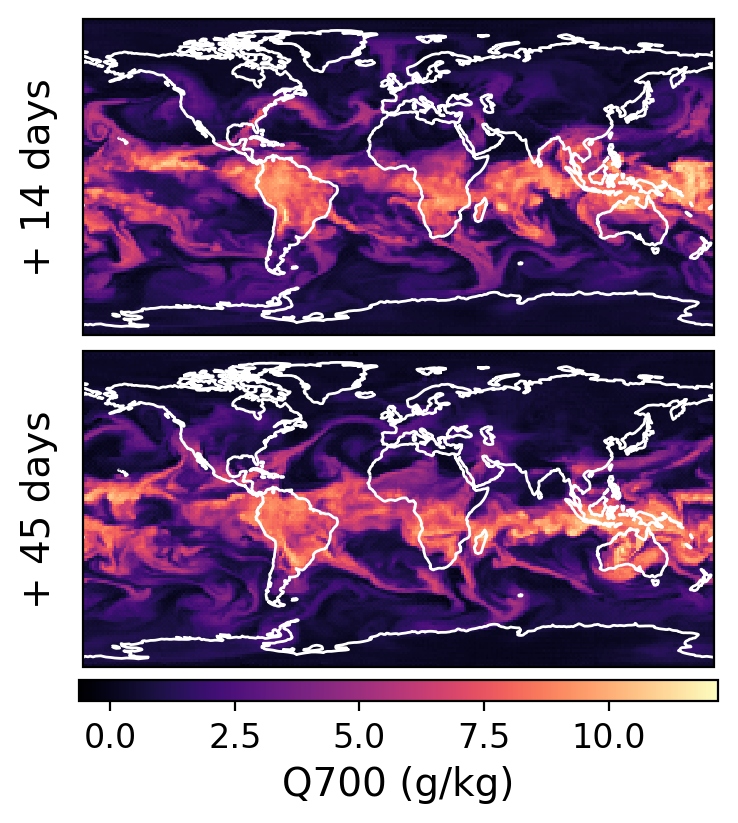

In [252]:
ds = xr.open_zarr(
    "/home/jstock/sf/prod/swift/results/era5-swinv2-1.4-scm/011/output/checkpoint-020000/output-1i-90s-1m-24h.zarr", 
    decode_timedelta=True, mask_and_scale=False
)
lats, lons = ds.latitude.values, ds.longitude.values
variable = 'specific_humidity'
data = ds[variable].isel(time=0, number=0, level=9).values

days = [14,45]
data = data[days] * 1000

norm = mcolors.Normalize(vmin=data.min(), vmax=data.max())

fontsize = 12
fig, axes = plt.subplots(
    2, 1, figsize=(6, 4), 
    subplot_kw={"projection": ccrs.PlateCarree()},
    constrained_layout=True
)

ims = []
for i, ax in enumerate(axes):
    im = ax.pcolormesh(
        lons, lats, data[i],
        transform=ccrs.PlateCarree(),
        cmap="magma",
        norm=norm,
    )
    ax.coastlines(color="white", linewidth=1)
    ax.text(-0.04, 0.5, f'+ {days[i]} days', va='bottom', ha='center',
        rotation='vertical', rotation_mode='anchor', fontsize=fontsize+2,
        transform=ax.transAxes)
    ims.append(im)

cbar = fig.colorbar(im, ax=axes, orientation="horizontal", 
                    pad=0.02, aspect=30, fraction=0.05, shrink=0.54)
cbar.set_label('Q700 (g/kg)', fontsize=fontsize+2)
cbar.ax.tick_params(labelsize=fontsize)

fig.savefig('q700_longrange.png', dpi=400, bbox_inches="tight")

plt.show()

In [235]:
ds = xr.open_zarr(
    '/home/jstock/sf/prod/swift/results/era5-swinv2-1.4-scm'
    '/011/output/checkpoint-020000/output-32i-75s-12m-24h.zarr',
    decode_timedelta=False, mask_and_scale=False
)
lats = ds.latitude.values
lons = ds.longitude.values

variables = [
    # {
    #     'name': 'z500',
    #     'variable': 'geopotential',
    #     'level': 7,
    # },
    # {
    #     'name': 'mslp',
    #     'variable': 'mean_sea_level_pressure',
    #     'level': None,
    # },
    # {
    #     'name': 'u10m',
    #     'variable': '10m_u_component_of_wind',
    #     'level': None,
    # },
    # {
    #     'name': 't850',
    #     'variable': 'temperature',
    #     'level': 10,
    # },
    # {
    #     'name': 'u850',
    #     'variable': 'u_component_of_wind',
    #     'level': 10,
    # },
    {
        'name': 'q700',
        'variable': 'specific_humidity',
        'level': 7,
    },
]

def _circumference(lats: np.ndarray) -> np.ndarray:
    """Earth's circumference as a function of latitude."""
    earth_radius_m = 1000 * (6357 + 6378) / 2
    circum_at_equator = 2 * np.pi * earth_radius_m
    return np.cos(lats * np.pi / 180) * circum_at_equator

def lon_spacing_m(lats: np.ndarray, lons: np.ndarray) -> np.ndarray:
    """Spacing (meters) between longitudinal values in `dataset`."""
    diff = lons[1] - lons[0]
    return _circumference(lats) * diff / 360

def simple_power(f_x):
    f_k = np.fft.rfft(f_x, axis=-1, norm='forward')
    one_and_many_twos = np.concatenate(([1], [2] * (f_k.shape[-1] - 1)))
    return np.real(f_k * np.conj(f_k)) * one_and_many_twos

# ─────────────────────────────────────────────────────────────
# Precompute dimensions & geometry
# ─────────────────────────────────────────────────────────────
timedeltas = ds['prediction_timedelta'].values[:48]
n_steps    = len(timedeltas)
n_ens      = 1 # ds.sizes['number']
n_times    = 32 # ds.sizes['time']
n_lat      = lats.size

# run simple_power once on zeros to get n_k
n_k        = simple_power(np.zeros((n_lat, lons.size))).shape[-1]
circum     = _circumference(lats)        # (n_lat,)

spacing = lon_spacing_m(lats, lons)      # (n_lat,)
base_f  = np.fft.rfftfreq(lons.size)     # (n_k,)

# ─────────────────────────────────────────────────────────────
# 4) Allocate and fill: (step, ens, time, lat, k)
# ─────────────────────────────────────────────────────────────
results = np.zeros((len(variables), n_steps, n_ens, n_times, n_lat, n_k), dtype=float)

for v, v_dict in enumerate(tqdm(variables, desc="variables")):
    variable = v_dict['variable']
    level = v_dict['level']
    for i, dt in enumerate(tqdm(timedeltas, desc="lead times", leave=False)):
        for ens in range(n_ens):
            for t in range(n_times):
                data2d = ds[variable].isel(
                    prediction_timedelta=i,
                    number=ens,
                    time=t,
                    **{f'level': level} if level is not None else {}
                ).values                              # (n_lat, n_lon)

                power2d = simple_power(data2d)        # (n_lat, n_k)
                results[v, i, ens, t, :, :] = power2d * circum[:, None]

# ─────────────────────────────────────────────────────────────
# 5) Mean over the TIME and ENSEMBLE axis
# ─────────────────────────────────────────────────────────────
lat_mask = (np.abs(lats) >= 30) & (np.abs(lats) <= 60) # mid-latitudes
# lat_mask = np.abs(lats) <= 20                        # tropics
results = results[:, :, :, :, lat_mask, :]
results = results.mean(axis=(2,3,4))                   # (n_variables, n_steps, n_k)

# ─────────────────────────────────────────────────────────────
# 6) Frequency & wavelength arrays
# ─────────────────────────────────────────────────────────────
frequency  = base_f[None, :] / spacing[:, None]    # (n_lat, n_k), units 1/m
wavelength = 1.0 / (frequency + 1e-10)             # (n_lat, n_k), units m

variables:   0%|          | 0/1 [00:00<?, ?it/s]

lead times:   0%|          | 0/48 [00:00<?, ?it/s]

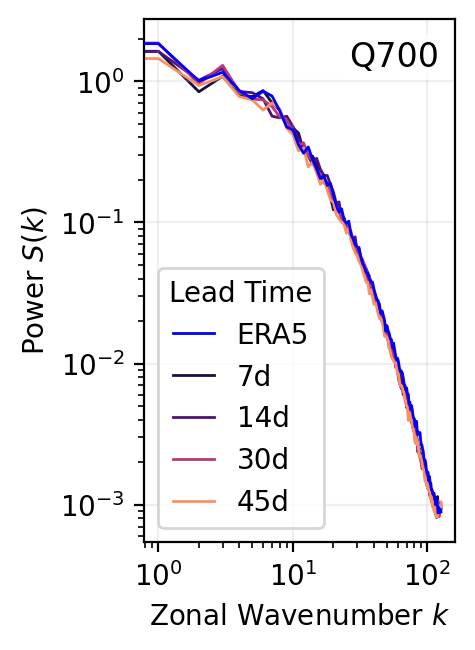

In [249]:
cmap   = plt.get_cmap('magma')
colors = cmap(np.linspace(0, 0.8, n_steps))

fig, ax = plt.subplots(1, 1, figsize=(2.5, 3.4))

for v, v_dict in enumerate(variables):
    variable = v_dict['variable']
    level = v_dict['level']

    for i in [0, 7, 14, 30, 45]:
        ax.loglog(
            results[v, i, 1:-1],
            label=f'{int(i)}d' if i > 0 else 'ERA5',
            color=colors[i] if i > 0 else 'blue',
            zorder=0 if i > 0 else 10,
            linewidth=1
        )

    ax.text(0.66, 0.91, f'{v_dict["name"].upper()}', fontsize=12, transform=ax.transAxes,
            bbox=dict(facecolor="white", alpha=0.7, edgecolor="none", pad=2, boxstyle="round,pad=0.2"))
    ax.grid(alpha=0.2)

    ax.set_xlabel('Zonal Wavenumber $k$')
    ax.set_ylabel('Power $S(k)$')

ax.legend(loc='lower left', fontsize=10, handlelength=1.5, title='Lead Time')
plt.tight_layout()

fig.savefig('q700_spectra.png', dpi=500, bbox_inches='tight')

plt.show()

2020-08-22T06:00:00.000000000


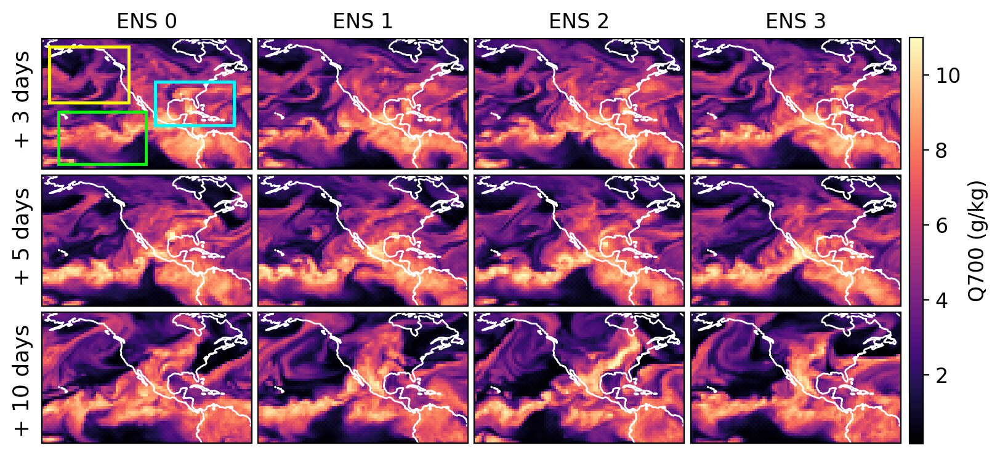

In [1001]:
ds = xr.open_zarr(
    '/home/jstock/sf/prod/swift/results/era5-swinv2-1.4-scm'
    '/011/output/checkpoint-020000/output-61i-60s-48m-6h.zarr',
    decode_timedelta=False, mask_and_scale=False
)

variable = 'specific_humidity'
level = 9
time = 9
print(ds.time.values[time])

box = ds.sel(latitude=slice(-10, 65), longitude=slice(190, 310))
steps = [12, 20, 40]
ens_cols = [0, 4, 2, 6]

vmin = float(box[variable].isel(time=0, number=0, prediction_timedelta=0, level=level).min())
vmax = float(box[variable].isel(time=0, number=0, prediction_timedelta=0, level=level).max())
norm = mcolors.Normalize(vmin=vmin * 1000.0, vmax=vmax * 1000.0)  # to g/kg

fontsize = 12
fig, axes = plt.subplots(
    nrows=len(steps), ncols=len(ens_cols),
    figsize=(9, 4.5),
    subplot_kw={"projection": ccrs.PlateCarree()},
    constrained_layout=False
)

axes = np.atleast_2d(axes)
lats = box.latitude.values
lons = box.longitude.values

ims = []
for r, step in enumerate(steps):
    for c, ens in enumerate(ens_cols):
        ax = axes[r, c]
        data_ens = box[variable].isel(time=time, number=ens, level=level).values  # (step, lat, lon)
        field = data_ens[step] * 1000.0  # to g/kg

        im = ax.pcolormesh(
            lons, lats, field,
            transform=ccrs.PlateCarree(),
            cmap="magma",
            norm=norm,
        )
        ax.coastlines(color="white", linewidth=1)
        ims.append(im)

        if r == 0:
            ax.set_title(f'ENS {c}', fontsize=fontsize)
            # ax.text(0.04, 0.86, f'ENS {c}', fontsize=fontsize-1, transform=ax.transAxes,
            #     bbox=dict(facecolor="white", alpha=0.7, edgecolor="none", pad=2, boxstyle="round,pad=0.2"))

        if c == 0:
            ax.text(
                -0.09, 0.91, f'+ {int(step * 6 // 24)} days',
                va='center', ha='right',
                rotation='vertical', rotation_mode='anchor',
                fontsize=fontsize+1, transform=ax.transAxes
            )
        ax.set_xticks([])
        ax.set_yticks([])

lat_min, lat_max = 15, 40
lon_min, lon_max = -105 + 360, -60 + 360
tc_box = mpatches.Rectangle(
    (lon_min, lat_min),
    lon_max - lon_min,
    lat_max - lat_min,
    linewidth=1.75,
    edgecolor='cyan',
    facecolor='none',
    transform=ccrs.PlateCarree(),
    zorder=10
)
axes[0, 0].add_patch(tc_box)

lat_min, lat_max = 28, 60
lon_min, lon_max = -165 + 360, -120 + 360
river_box = mpatches.Rectangle(
    (lon_min, lat_min),
    lon_max - lon_min,
    lat_max - lat_min,
    linewidth=1.75,
    edgecolor='yellow',
    facecolor='none',
    transform=ccrs.PlateCarree(),
    zorder=10
)
axes[0, 0].add_patch(river_box)

lat_min, lat_max = -7, 23
lon_min, lon_max = -160 + 360, -110 + 360
icz_box = mpatches.Rectangle(
    (lon_min, lat_min),
    lon_max - lon_min,
    lat_max - lat_min,
    linewidth=1.75,
    edgecolor='lime',
    facecolor='none',
    transform=ccrs.PlateCarree(),
    zorder=10
)
axes[0, 0].add_patch(icz_box)

cbar_ax = fig.add_axes([0.908, 0.128, 0.012, 0.735])  # [left, bottom, width, height]
cbar = fig.colorbar(ims[-1], cax=cbar_ax)
cbar.set_label('Q700 (g/kg)', fontsize=fontsize)
cbar.ax.tick_params(labelsize=fontsize)
plt.subplots_adjust(wspace=0.03, hspace=-0.1)

fig.savefig('q700_tc_river_icz_ensembles.png', dpi=300, bbox_inches='tight')

plt.show()

2020-08-22T12:00:00.000000000


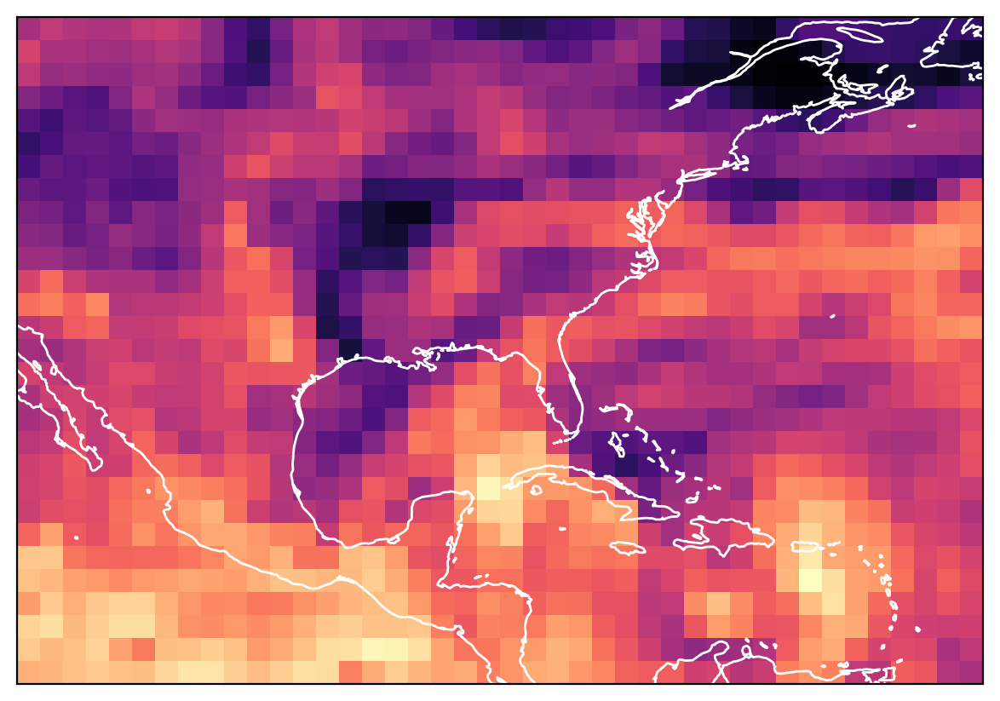

In [648]:
ds = xr.open_zarr(
    '/home/jstock/sf/prod/swift/results/era5-swinv2-1.4-scm'
    '/011/output/checkpoint-020000/output-61i-60s-48m-6h.zarr',
    decode_timedelta=False, mask_and_scale=False
)

time = 10
print(ds.time.values[time])

era5 = ds.isel(time=slice(time, time+31), number=0, prediction_timedelta=0)
era5 = era5.sel(latitude=slice(10, 50), longitude=slice(245, 305))

lats = era5.latitude.values
lons = era5.longitude.values

q700 = era5['specific_humidity'].isel(level=9).values
mslp = era5['mean_sea_level_pressure'].values

fontsize = 12
fig, ax = plt.subplots(
    nrows=1, ncols=1,
    figsize=(6, 4),
    subplot_kw={"projection": ccrs.PlateCarree()},
    constrained_layout=True
)

im = ax.pcolormesh(
        lons, lats, q700[0],
        transform=ccrs.PlateCarree(),
        cmap="magma",
    )
ax.coastlines(color="white", linewidth=1)
plt.show()

2020-08-25T06:00:00.000000000 2020-09-01T18:00:00.000000000


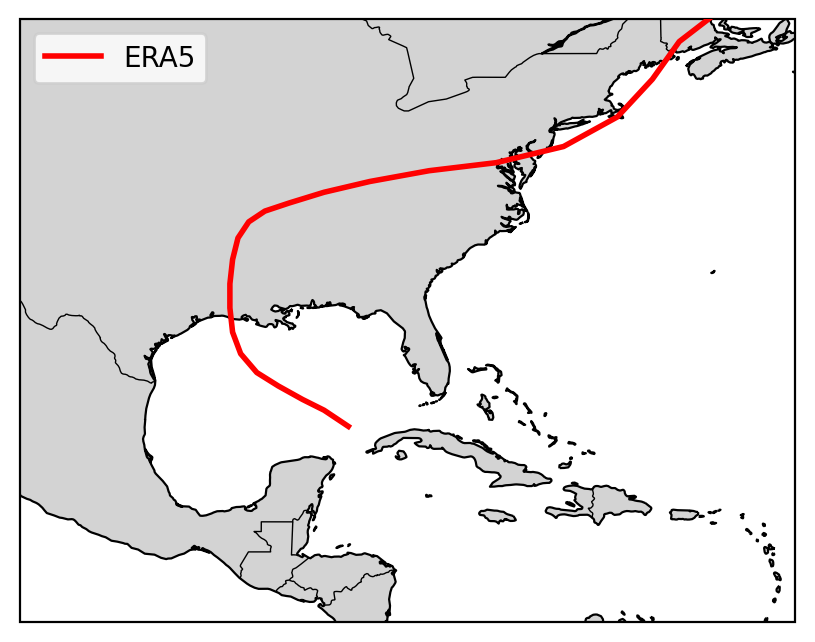

In [2]:
# ----------------------------
# Utilities
# ----------------------------
EARTH_R = 6_371_000.0  # meters

def _grid_metrics(lats, lons):
    """Return dy (m) and dx(lat) (m) for regular lat-lon grid."""
    lats = np.asarray(lats, dtype=np.float64)
    lons = np.asarray(lons, dtype=np.float64)
    # Handle ascending vs descending latitude order
    dlat_deg = np.abs(lats[1] - lats[0])
    dlon_deg = np.abs(lons[1] - lons[0])
    dlat = np.deg2rad(dlat_deg)
    dlon = np.deg2rad(dlon_deg)
    # dy is constant with lon, dx varies with latitude (cos φ)
    dy = EARTH_R * dlat
    dx_lat = EARTH_R * dlon * np.cos(np.deg2rad(lats))  # shape (Ny,)
    return dy, dx_lat  # meters

def _central_diff_x(arr, dx_lat):
    """
    Central difference in x (longitude) for shape (Ny, Nx).
    dx_lat is (Ny,) meters per lon step at each latitude.
    """
    Ny, Nx = arr.shape
    out = np.empty_like(arr, dtype=np.float64)
    # Interior
    out[:, 1:-1] = (arr[:, 2:] - arr[:, :-2]) / (2.0 * dx_lat[:, None])
    # One-sided edges
    out[:, 0]  = (arr[:, 1] - arr[:, 0]) / dx_lat[:, None].ravel()
    out[:, -1] = (arr[:, -1] - arr[:, -2]) / dx_lat[:, None].ravel()
    return out

def _central_diff_y(arr, dy):
    """
    Central difference in y (latitude) for shape (Ny, Nx).
    dy is scalar meters per lat step (assumed uniform).
    """
    Ny, Nx = arr.shape
    out = np.empty_like(arr, dtype=np.float64)
    out[1:-1, :] = (arr[2:, :] - arr[:-2, :]) / (2.0 * dy)
    out[0,  :]   = (arr[1,  :] - arr[0,  :]) / dy
    out[-1, :]   = (arr[-1, :] - arr[-2, :]) / dy
    return out

def _smooth_3x3(a, iters=1):
    """Cheap 3x3 mean filter, repeated `iters` times."""
    out = a.astype(np.float64, copy=True)
    for _ in range(max(0, iters)):
        padded = np.pad(out, ((1,1),(1,1)), mode='edge')
        neigh_sum = (
            padded[0:-2, 0:-2] + padded[0:-2, 1:-1] + padded[0:-2, 2:] +
            padded[1:-1, 0:-2] + padded[1:-1, 1:-1] + padded[1:-1, 2:] +
            padded[2:,   0:-2] + padded[2:,   1:-1] + padded[2:,   2:]
        )
        out = neigh_sum / 9.0
    return out

def _zscore(x):
    mu = np.nanmean(x)
    sd = np.nanstd(x)
    if sd == 0 or not np.isfinite(sd):
        return np.zeros_like(x, dtype=np.float64)
    return (x - mu) / sd

def _cost_field(mslp_t, vort_t, w_mslp=1.0, w_vort=1.0):
    """
    Lower is better. We want low MSLP and high vorticity.
    cost = w_mslp * z(mslp) - w_vort * z(vort)
    """
    return w_mslp * _zscore(mslp_t) - w_vort * _zscore(vort_t)

# ----------------------------
# Diagnostics
# ----------------------------
def compute_vorticity(u850, v850, lats, lons):
    """
    u850, v850: shape (T, Ny, Nx) in m/s
    lats, lons: 1D
    returns: vort (T, Ny, Nx) in s^-1
    """
    dy, dx_lat = _grid_metrics(lats, lons)
    vort = np.empty_like(u850, dtype=np.float64)
    for t in range(u850.shape[0]):
        u = np.asarray(u850[t], dtype=np.float64)
        v = np.asarray(v850[t], dtype=np.float64)
        dvdx = _central_diff_x(v, dx_lat)  # ∂v/∂x
        dudy = _central_diff_y(u, dy)      # ∂u/∂y
        vort[t] = dvdx - dudy              # ζ
    return vort

# ----------------------------
# Tracking
# ----------------------------
def _seed_from_cost(mslp0, vort0, smooth_iters=1, w_mslp=1.0, w_vort=1.0):
    """Find initial (i,j) by minimizing cost on t=0."""
    m0 = _smooth_3x3(mslp0, iters=smooth_iters) if smooth_iters > 0 else mslp0
    v0 = _smooth_3x3(vort0, iters=smooth_iters) if smooth_iters > 0 else vort0
    cost0 = _cost_field(m0, v0, w_mslp=w_mslp, w_vort=w_vort)
    ij = np.unravel_index(np.nanargmin(cost0), cost0.shape)
    return ij

def _search_window_slices(i0, j0, Ny, Nx, rad):
    i_min = max(0, i0 - rad); i_max = min(Ny - 1, i0 + rad)
    j_min = max(0, j0 - rad); j_max = min(Nx - 1, j0 + rad)
    return i_min, i_max, j_min, j_max

def _pick_next(mslp_t, vort_t, i_prev, j_prev, lats, lons,
               search_rad=4, w_mslp=1.0, w_vort=1.0, w_dist=0.25, smooth_iters=0):
    """
    Choose (i,j) at time t by minimizing: cost + w_dist * normalized_distance.
    """
    Ny, Nx = mslp_t.shape
    # Prep fields
    m = _smooth_3x3(mslp_t, iters=smooth_iters) if smooth_iters > 0 else mslp_t
    v = _smooth_3x3(vort_t, iters=smooth_iters) if smooth_iters > 0 else vort_t
    base_cost = _cost_field(m, v, w_mslp=w_mslp, w_vort=w_vort)

    # Window around previous fix (keep as a 2D block)
    i_min, i_max, j_min, j_max = _search_window_slices(i_prev, j_prev, Ny, Nx, search_rad)

    win_cost = base_cost[i_min:i_max+1, j_min:j_max+1]
    if win_cost.size == 0 or not np.isfinite(win_cost).any():
        # fallback to global minimum
        return np.unravel_index(np.nanargmin(base_cost), base_cost.shape)

    # Distance penalty over the same 2D window
    ii = np.arange(i_min, i_max+1)
    jj = np.arange(j_min, j_max+1)
    lat0 = lats[i_prev]; lon0 = lons[j_prev]
    LAT, LON = np.meshgrid(lats[ii], lons[jj], indexing="ij")

    dlat = np.deg2rad(LAT - lat0)
    dlon = np.deg2rad(LON - lon0) * np.cos(np.deg2rad(0.5*(LAT + lat0)))
    dist_km = np.sqrt((EARTH_R * dlat)**2 + (EARTH_R * dlon)**2) / 1000.0

    dnorm = (dist_km - np.nanmean(dist_km)) / (np.nanstd(dist_km) + 1e-9)

    total = win_cost + w_dist * dnorm
    wi, wj = np.unravel_index(np.nanargmin(total), total.shape)
    return i_min + int(wi), j_min + int(wj)

def track_from_fields(mslp, u850, v850, lats, lons,
                      smooth_iters_seed=1, smooth_iters_step=0,
                      search_rad=4, w_mslp=1.0, w_vort=1.2, w_dist=0.25):
    """
    mslp, u850, v850: arrays (T, Ny, Nx)
    lats, lons: 1D coordinate vectors (Ny,), (Nx,)
    Returns: track_lats (T,), track_lons (T,), ij_indices [(i,j), ...]
    """
    T, Ny, Nx = mslp.shape
    vort = compute_vorticity(u850, v850, lats, lons)

    # Seed at t=0
    i0, j0 = _seed_from_cost(mslp[0], vort[0],
                             smooth_iters=smooth_iters_seed,
                             w_mslp=w_mslp, w_vort=w_vort)

    ij = [(i0, j0)]
    for t in range(1, T):
        ip, jp = ij[-1]
        i, j = _pick_next(mslp[t], vort[t], ip, jp, lats, lons,
                          search_rad=search_rad,
                          w_mslp=w_mslp, w_vort=w_vort, w_dist=w_dist,
                          smooth_iters=smooth_iters_step)
        ij.append((i, j))

    track_lats = np.array([lats[i] for i, _ in ij], dtype=np.float64)
    track_lons = np.array([lons[j] for _, j in ij], dtype=np.float64)
    return track_lats, track_lons, ij

# ----------------------------
# Smoothing
# ----------------------------
def _proj_xy(lats, lons):
    """Equirectangular-ish projection for short smoothing windows."""
    lat0 = float(np.nanmean(lats))
    x = np.deg2rad(lons) * np.cos(np.deg2rad(lat0)) * EARTH_R
    y = np.deg2rad(lats) * EARTH_R
    return x, y, lat0

def _unproj_xy(x, y, lat0):
    lats = np.rad2deg(y / EARTH_R)
    lons = np.rad2deg(x / (EARTH_R * np.cos(np.deg2rad(lat0))))
    return lats, lons

def _tri_kernel(win):
    win = int(win) | 1  # force odd
    half = win // 2
    w = np.arange(1, half+2)
    k = np.concatenate([w, w[-2::-1]]).astype(float)
    k /= k.sum()
    return k

def smooth_track_running_mean(track_lats, track_lons, win=5):
    """
    Zero-phase (centered) triangular moving average in projected meters.
    Use small odd window (3-7). Won't overshoot like SG if the path bends.
    """
    x, y, lat0 = _proj_xy(track_lats, track_lons)
    k = _tri_kernel(win)
    pad = len(k)//2
    x_pad = np.pad(x, (pad, pad), mode="edge")
    y_pad = np.pad(y, (pad, pad), mode="edge")
    xs = np.convolve(x_pad, k, mode="valid")
    ys = np.convolve(y_pad, k, mode="valid")
    lat_s, lon_s = _unproj_xy(xs, ys, lat0)
    return lat_s, ((lon_s + 180) % 360) - 180  # keep to [-180,180]


ds = xr.open_zarr(
    '/home/jstock/sf/prod/swift/results/era5-swinv2-1.4-scm'
    '/011/output/checkpoint-020000/output-61i-60s-48m-6h.zarr',
    decode_timedelta=False, mask_and_scale=False
)

time = 21
steps = 30
print(ds.time.values[time], ds.time.values[time+steps])

box = ds.sel(latitude=slice(10, 50), longitude=slice(245, 305))
lats = box.latitude.values
lons = box.longitude.values

era5 = box.isel(time=slice(time, time+steps), number=0, prediction_timedelta=0)

mslp = era5['mean_sea_level_pressure'].values
q700 = era5['specific_humidity'].isel(level=9).values
u850 = era5['u_component_of_wind'].isel(level=10).values
v850 = era5['v_component_of_wind'].isel(level=10).values

era5_track_lats, era5_track_lons, _ = track_from_fields(
    mslp, u850, v850,
    lats, lons,
    smooth_iters_seed=1,   # smooth seed selection (robust)
    smooth_iters_step=0,   # leave 0 for sharper step-to-step response
    search_rad=3,          # radius in grid cells for temporal association
    w_mslp=1.0,            # weight for low pressure
    w_vort=1.2,            # weight for high vorticity
    w_dist=0.3             # penalty for jumping far in window
)

era5_track_lats, era5_track_lons = smooth_track_running_mean(era5_track_lats, era5_track_lons, win=4)
era5_track_lons = ((era5_track_lons + 180) % 360) - 180

proj = ccrs.PlateCarree()
fig, ax = plt.subplots(figsize=(5,4), subplot_kw={"projection": proj})
ax.set_extent([-105, -60, 12, 47], crs=proj)
ax.coastlines(resolution="50m", linewidth=0.8)
ax.add_feature(cfeature.BORDERS, linewidth=0.5)
ax.add_feature(cfeature.LAND, facecolor="lightgray", edgecolor="none", alpha=1)

ax.plot(era5_track_lons, era5_track_lats, "-", lw=2, zorder=5, color='red', label='ERA5')
ax.legend(loc='upper left')
plt.show()

In [174]:
ds = xr.open_zarr(
    '/home/jstock/sf/prod/swift/results/era5-swinv2-1.4-scm'
    '/011/output/checkpoint-020000/output-61i-60s-48m-6h.zarr',
    decode_timedelta=False, mask_and_scale=False
)

time, steps = 9, 30
# time, steps = 21, 28
# time, steps = 25, 16
print(ds.time.values[time], ds.time.values[time+steps])

box = ds.sel(latitude=slice(10, 50), longitude=slice(245, 305))
lats = box.latitude.values
lons = box.longitude.values

# ----------------------------
# Ensembles
# ----------------------------
ensemble_lats, ensemble_lons = [], []
for i in range(48):
    data = box.isel(time=time, number=i, prediction_timedelta=slice(0, steps))

    mslp = data['mean_sea_level_pressure'].values
    q700 = data['specific_humidity'].isel(level=9).values
    u850 = data['u_component_of_wind'].isel(level=10).values
    v850 = data['v_component_of_wind'].isel(level=10).values

    track_lats, track_lons, ij = track_from_fields(
        mslp, u850, v850,
        lats, lons,
        smooth_iters_seed=1,   # smooth seed selection (robust)
        smooth_iters_step=0,   # leave 0 for sharper step-to-step response
        search_rad=3,          # radius in grid cells for temporal association
        w_mslp=1.0,            # weight for low pressure
        w_vort=1.2,            # weight for high vorticity
        w_dist=0.3             # penalty for jumping far in window
    )
    
    ensemble_lats.append(track_lats)
    ensemble_lons.append(track_lons)


# ----------------------------
# ERA5
# ----------------------------
era5 = box.isel(time=slice(time, time+steps), number=0, prediction_timedelta=0)

mslp = era5['mean_sea_level_pressure'].values
q700 = era5['specific_humidity'].isel(level=9).values
u850 = era5['u_component_of_wind'].isel(level=10).values
v850 = era5['v_component_of_wind'].isel(level=10).values

era5_track_lats, era5_track_lons, _ = track_from_fields(
    mslp, u850, v850,
    lats, lons,
    smooth_iters_seed=1,   # smooth seed selection (robust)
    smooth_iters_step=0,   # leave 0 for sharper step-to-step response
    search_rad=3,          # radius in grid cells for temporal association
    w_mslp=1.0,            # weight for low pressure
    w_vort=1.2,            # weight for high vorticity
    w_dist=0.3             # penalty for jumping far in window
)

2020-08-22T06:00:00.000000000 2020-08-29T18:00:00.000000000


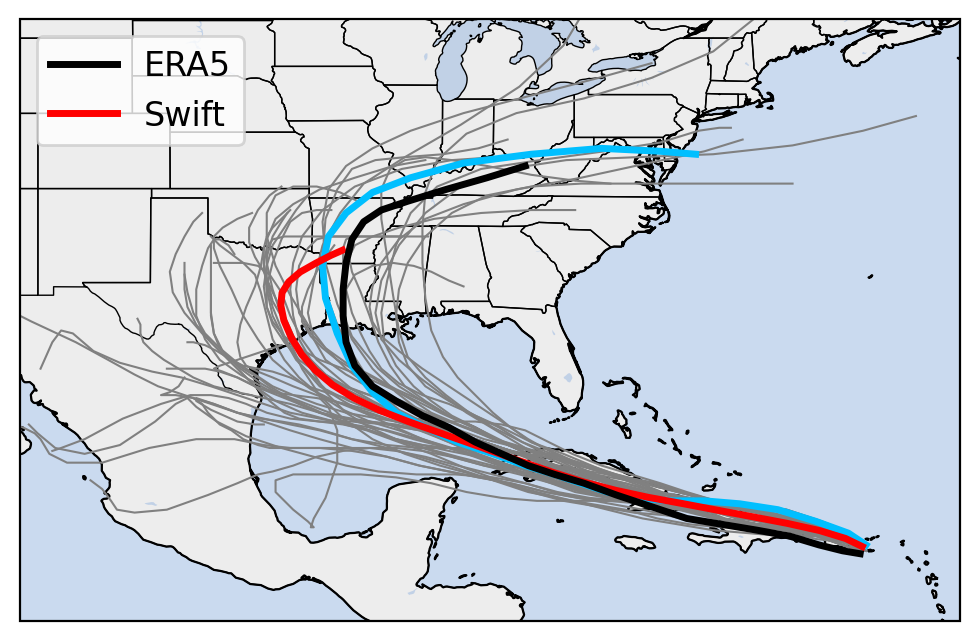

In [175]:
proj = ccrs.PlateCarree()
fig, ax = plt.subplots(figsize=(5, 4.2), subplot_kw={"projection": proj})
ax.set_extent([-110, -60, 14, 46], crs=proj)
ax.coastlines(resolution="50m", linewidth=0.8)
ax.add_feature(cfeature.OCEAN.with_scale("50m"), alpha=0.5)
ax.add_feature(cfeature.LAKES.with_scale("50m"), alpha=0.5)
ax.add_feature(cfeature.COASTLINE.with_scale("50m"), linewidth=0.5)
ax.add_feature(cfeature.STATES.with_scale("50m"), linewidth=0.5)
ax.add_feature(cfeature.LAND, facecolor="lightgray", edgecolor="none", alpha=0.4)

e_lats_era5, e_lons_era5 = smooth_track_running_mean(era5_track_lats, era5_track_lons, win=4)
e_lons_era5 = ((e_lons_era5 + 180) % 360) - 180
ax.plot(e_lons_era5, e_lats_era5, "-", lw=2.5, zorder=5, color='black', label='ERA5')

for i, (e_lats, e_lons) in enumerate(zip(ensemble_lats, ensemble_lons)):
    e_lats, e_lons = smooth_track_running_mean(e_lats, e_lons, win=4)
    e_lons = ((e_lons + 180) % 360) - 180
    ax.plot(e_lons, e_lats, "-", color="gray", lw=0.75)

idx, minimum = -1, 1e10
for i, (e_lats, e_lons) in enumerate(zip(ensemble_lats, ensemble_lons)):
    e_lats, e_lons = smooth_track_running_mean(e_lats, e_lons, win=4)
    e_lons = ((e_lons + 180) % 360) - 180
    rmse = np.sqrt(np.mean(((e_lons - e_lons_era5) ** 2)))
    if rmse < minimum:
        minimum = rmse
        idx = i
idx = 41 # 36, 14, 41, 47
e_lats, e_lons = ensemble_lats[idx], ensemble_lons[idx]
e_lats, e_lons = smooth_track_running_mean(e_lats, e_lons, win=4)
e_lons = ((e_lons + 180) % 360) - 180
ax.plot(e_lons, e_lats, "-", lw=2.5, color='deepskyblue')

# plot mean line for Swift
e_lats, e_lons = smooth_track_running_mean(np.stack(ensemble_lats).mean(axis=0), np.stack(ensemble_lons).mean(axis=0), win=4)
e_lons = ((e_lons + 180) % 360) - 180
ax.plot(e_lons, e_lats, "-", lw=2.5, color='red', label='Swift')

ax.legend(loc='upper left', fontsize=12)
# ax.set_title(f"{str(ds.time.values[time]).split(':')[0]} [+{int(steps * 6 / 24)} days]")
fig.tight_layout()

fig.savefig('tc_track.png', dpi=300, bbox_inches='tight')

plt.show()

In [128]:
# 1.4
swift_base = '/home/jstock/sf/prod/swift/results/era5-swinv2-1.4-scm/006/output/checkpoint-015000/6h_evaluation_metrics.json'
swift = '/home/jstock/sf/prod/swift/results/era5-swinv2-1.4-scm/011/output/checkpoint-020000/6h_evaluation_metrics.json'
diffusion = '/home/jstock/sf/prod/swift/results/era5-swinv2-1.4-trigflow/004/output/checkpoint-015000/evaluation_metrics.json'
baseline = '/home/jstock/sf/data/wb2/results/240x121-probabilistic.json'

# open each 
with open(swift_base, 'r') as f:
    swift_base = json.load(f)
with open(swift, 'r') as f:
    swift = json.load(f)
with open(diffusion, 'r') as f:
    diffusion = json.load(f)
with open(baseline, 'r') as f:
    baseline = json.load(f)

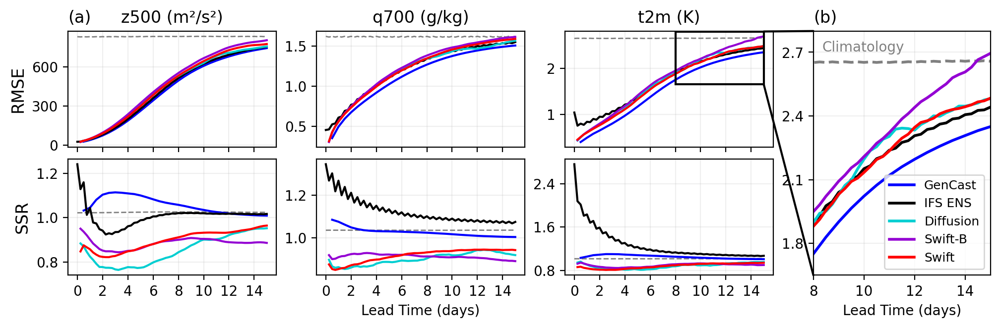

In [157]:
import matplotlib.pyplot as plt
import matplotlib.ticker as tck
from matplotlib.gridspec import GridSpec
from matplotlib.patches import Rectangle, ConnectionPatch

baseline_models = {
    'Probabilistic Climatology vs ERA5': {'color': 'gray', 'linestyle': '--', 'linewidth': 1, 'label': None},
    'GenCast vs ERA5': {'color': 'blue', 'linestyle': '-', 'label': 'GenCast'},
    'IFS ENS vs ERA5': {'color': 'black', 'linestyle': '-', 'label': 'IFS ENS'},
}
variables = {
    'z500 (m²/s²)': {'key': 'geopotential_500'},
    'q700 (g/kg)': {'key': 'specific_humidity_700', 'scale': 1000},
    't2m (K)': {'key': '2m_temperature'},
}

# --- make a 2x3 grid + one tall zoom column ---
fig = plt.figure(figsize=(12, 3.2))  # a bit wider to fit the zoom panel
gs = GridSpec(2, 4, figure=fig, width_ratios=[1, 1, 1, 0.85], wspace=0.2, hspace=0.1)
axs = np.empty((2,3), dtype=object)

for r in range(2):
    for c in range(3):
        axs[r, c] = fig.add_subplot(gs[r, c])

ax_zoom = fig.add_subplot(gs[:, 3])  # spans both rows

# --- your existing plotting, unchanged except it uses axs created above ---
for i, metric in enumerate(['rmse', 'ssr']):
    for j, (label, var) in enumerate(variables.items()):
        ax = axs[i, j]

        for key, config in baseline_models.items():
            data = baseline[key]['metrics'][metric]
            xs, ys = [], []
            for t, d in data.items():
                y = d[var['key']]
                if y is None:
                    continue
                elif 'scale' in var and metric != 'ssr':
                    y *= var['scale']
                xs.append(t); ys.append(y)
            ax.plot(xs, ys, **config)

        xs, ys = [], []
        for t, d in diffusion['metrics'][metric].items():
            y = d[var['key']]
            if y is None:
                continue
            elif 'scale' in var and metric != 'ssr':
                y *= var['scale']
            xs.append(t); ys.append(y)
        ax.plot(xs[1:], ys[1:], color='darkturquoise', label='Diffusion')

        xs, ys = [], []
        for t, d in swift_base['metrics'][metric].items():
            y = d[var['key']]
            if y is None:
                continue
            elif 'scale' in var and metric != 'ssr':
                y *= var['scale']
            xs.append(t); ys.append(y)
        ax.plot(xs[1:], ys[1:], color='darkviolet', label='Swift-B')


        xs, ys = [], []
        for t, d in swift['metrics'][metric].items():
            y = d[var['key']]
            if y is None:
                continue
            elif 'scale' in var and metric != 'ssr':
                y *= var['scale']
            xs.append(t); ys.append(y)
        ax.plot(xs[1:], ys[1:], color='red', label='Swift')

        if j == 0:
            ax.set_ylabel(metric.upper(), fontsize=12)
        if i == 0:
            ax.set_title(label)
        ax.grid(alpha=0.2)

# ticks/formatters
for ax in axs.flatten():
    ax.yaxis.set_major_locator(tck.MaxNLocator(nbins=3))
    ax.xaxis.set_major_locator(tck.MultipleLocator(8))
    ax.xaxis.set_major_formatter(tck.FuncFormatter(lambda x, pos: f"{int(x/4)}"))

for ax in axs[0, :]:
    ax.set_xticklabels([])

# ===== ZOOM PANEL SETUP =====
# Source subplot: column 0, "row 2" (0-based index 1)
ax_src = axs[0, 2]

# pick your zoom box in *the same units as x/y on ax_src*
# helper to express x-range in days if your x is 6-hour steps
days_to_steps = lambda d: 4*d
zoom_xlim = (days_to_steps(8), days_to_steps(15))  # e.g., 2–10 days
# Y-range: pick something meaningful for your data
# (you can compute from lines; here’s an example using current data limits)
# zoom_y_pad = 0.05 * (ax_src.get_ylim()[1] - ax_src.get_ylim()[0])
# zoom_ylim = (ax_src.get_ylim()[0] + zoom_y_pad, ax_src.get_ylim()[0] + 0.35*(ax_src.get_ylim()[1]-ax_src.get_ylim()[0]))
zoom_ylim = (1.65, 2.8)

# draw the rectangle on the source axis
zx0, zx1 = zoom_xlim
zy0, zy1 = zoom_ylim
rect = Rectangle((zx0, zy0), (zx1 - zx0), (zy1 - zy0),
                 fill=False, lw=1.5, ls='-', ec='k', zorder=5)
ax_src.add_patch(rect)

# mirror the plotted lines into the zoom axis
ax_zoom.cla()
for line in ax_src.get_lines():
    ax_zoom.plot(line.get_xdata(), line.get_ydata(),
                 color=line.get_color(),
                 linestyle=line.get_linestyle(),
                 linewidth=2,
                 label=line.get_label())

ax_zoom.set_xlim(zoom_xlim)
ax_zoom.set_ylim(zoom_ylim)
ax_zoom.grid(alpha=0.2)
ax_zoom.xaxis.set_major_locator(tck.MultipleLocator(8))
ax_zoom.xaxis.set_major_formatter(tck.FuncFormatter(lambda x, pos: f"{int(x/4)}"))
ax_zoom.yaxis.set_major_locator(tck.MaxNLocator(nbins=4))

ax_zoom.legend(frameon=True, fontsize=9)

# connector lines from rectangle corners to zoom axis
# (connect right side of rect to left side of zoom axis)
transFigure = fig.transFigure
for xy_src, xy_zoom in [((zx1, zy1), (ax_zoom.get_xlim()[0], ax_zoom.get_ylim()[1])),
                        ((zx1, zy0), (ax_zoom.get_xlim()[0], ax_zoom.get_ylim()[0]))]:
    con = ConnectionPatch(xyA=xy_zoom, coordsA=ax_zoom.transData,
                          xyB=xy_src, coordsB=ax_src.transData,
                          arrowstyle='-', lw=1.5, color='k', zorder=4)
    fig.add_artist(con)

axs[0,0].set_title('(a)', fontsize=12, loc='left')
ax_zoom.set_title('(b)', fontsize=12, loc='left')

axs[1, 1].set_xlabel('Lead Time (days)', fontsize=10)
ax_zoom.set_xlabel('Lead Time (days)', fontsize=10)
ax_zoom.text(0.05, 0.96, 'Climatology', color='gray', fontsize=10, va='top', ha='left', transform=ax_zoom.transAxes)

fig.savefig(f'skill_summary.png', dpi=300, bbox_inches='tight')
plt.show()

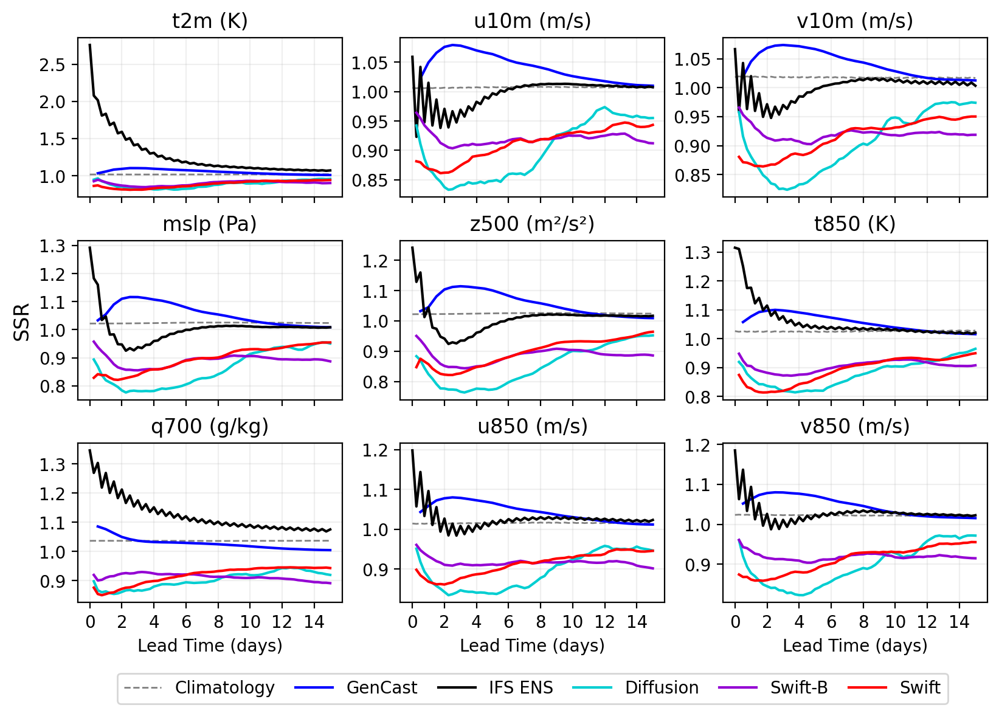

In [1414]:
metric = 'ssr'

baseline_models = {
    'Probabilistic Climatology vs ERA5': {'color': 'gray', 'linestyle': '--', 'linewidth': 1, 'label': 'Climatology'},
    'GenCast vs ERA5': {'color': 'blue', 'linestyle': '-', 'label': 'GenCast'},
    'IFS ENS vs ERA5': {'color': 'black', 'linestyle': '-', 'label': 'IFS ENS'},
}
variables = {
    't2m (K)': {'key': '2m_temperature'},
    'u10m (m/s)': {'key': '10m_u_component_of_wind'},
    'v10m (m/s)': {'key': '10m_v_component_of_wind'},
    'mslp (Pa)': {'key': 'mean_sea_level_pressure'},
    'z500 (m²/s²)': {'key': 'geopotential_500'},
    't850 (K)': {'key': 'temperature_850'},
    'q700 (g/kg)': {'key': 'specific_humidity_700', 'scale': 1000},
    'u850 (m/s)': {'key': 'u_component_of_wind_850'},
    'v850 (m/s)': {'key': 'v_component_of_wind_850'}
}

fig = plt.figure(figsize=(8, 6))
gs = GridSpec(
    4, 3, figure=fig,
    height_ratios=[1, 1, 1, 0.12],
    hspace=0.35, wspace=0.22
)
axs = np.array([[fig.add_subplot(gs[r, c]) for c in range(3)] for r in range(3)]).flatten()

# --- plotting (unchanged) ---
for i, (label, var) in enumerate(variables.items()):
    ax = axs[i]

    for key, config in baseline_models.items():
        data = baseline[key]['metrics'][metric]
        xs, ys = [], []
        for t, d in data.items():
            y = d[var['key']]
            if y is None:
                continue
            elif 'scale' in var and metric != 'ssr':
                y *= var['scale']
            xs.append(t); ys.append(y)
        ax.plot(xs, ys, **config)

    xs, ys = [], []
    for t, d in diffusion['metrics'][metric].items():
        y = d[var['key']]
        if y is None: continue
        elif 'scale' in var and metric != 'ssr': y *= var['scale']
        xs.append(t); ys.append(y)
    ax.plot(xs[1:], ys[1:], color='darkturquoise', label='Diffusion')

    xs, ys = [], []
    for t, d in swift_base['metrics'][metric].items():
        y = d[var['key']]
        if y is None: continue
        elif 'scale' in var and metric != 'ssr': y *= var['scale']
        xs.append(t); ys.append(y)
    ax.plot(xs[1:], ys[1:], color='darkviolet', label='Swift-B')

    xs, ys = [], []
    for t, d in swift['metrics'][metric].items():
        y = d[var['key']]
        if y is None: continue
        elif 'scale' in var and metric != 'ssr': y *= var['scale']
        xs.append(t); ys.append(y)
    ax.plot(xs[1:], ys[1:], color='red', label='Swift')

    ax.set_title(label, pad=6)
    ax.grid(alpha=0.2)
    ax.locator_params(axis='y', nbins=6)

# tidy x-ticks and labels
for ax in axs:
    ax.xaxis.set_major_locator(tck.MultipleLocator(8))
    ax.xaxis.set_major_formatter(tck.FuncFormatter(lambda x, pos: f"{int(x/4)}"))

for i, ax in enumerate(axs):
    if i > 5:
        ax.set_xlabel('Lead Time (days)')
    else:
        ax.tick_params(labelbottom=False)

axs[3].set_ylabel(metric.upper(), fontsize=12)

# --- legend INSIDE the figure ---
legend_ax = fig.add_subplot(gs[3, :])  # short row reserved for legend
legend_ax.axis('off')

handles, labels = axs[-1].get_legend_handles_labels()
if not any('Climatology' in lbl for lbl in labels):
    h0, l0 = axs[0].get_legend_handles_labels()
    handles, labels = h0, l0

legend_ax.legend(
    handles, labels,
    loc='lower center',
    ncol=len(labels),
    frameon=True,
    fontsize='medium',
    handlelength=2.2,
    columnspacing=1.2,
    borderaxespad=-2.3
)

fig.subplots_adjust(left=0.06, right=0.995, top=0.94, bottom=0.08)

fig.savefig(f'skill_{metric}.png', dpi=300, bbox_inches='tight')

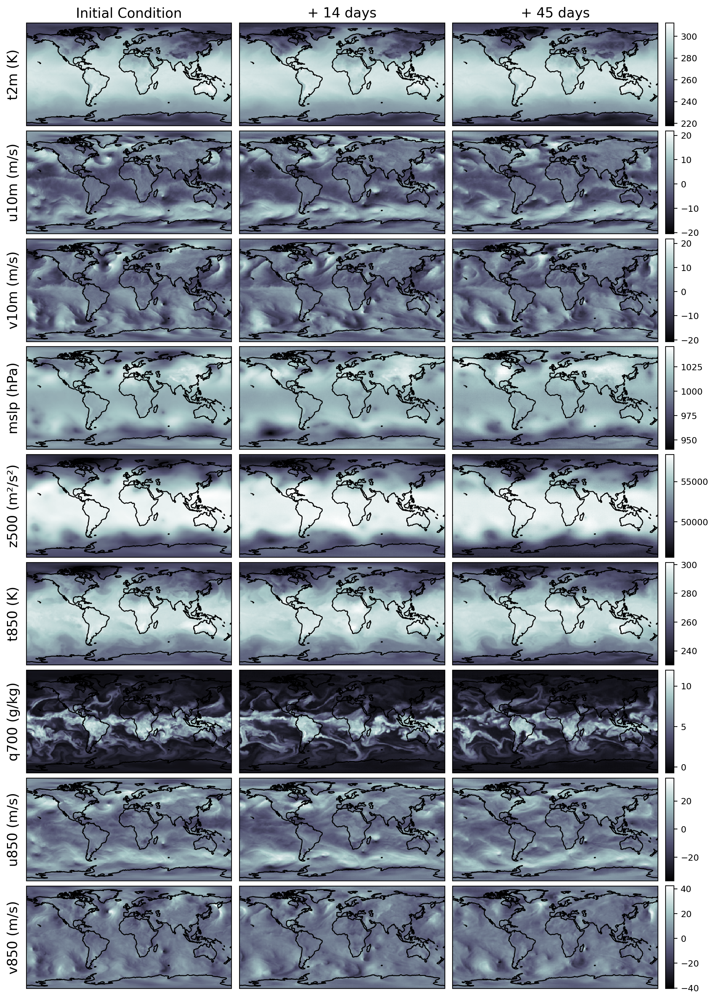

In [413]:
ds = xr.open_zarr(
    "/home/jstock/sf/prod/swift/results/era5-swinv2-1.4-scm/011/output/checkpoint-020000/"
    "output-32i-75s-12m-24h.zarr", 
    decode_timedelta=True, mask_and_scale=False
)
lats, lons = ds.latitude.values, ds.longitude.values

variables = {
    't2m (K)': {'key': '2m_temperature'},
    'u10m (m/s)': {'key': '10m_u_component_of_wind'},
    'v10m (m/s)': {'key': '10m_v_component_of_wind'},
    'mslp (hPa)': {'key': 'mean_sea_level_pressure', 'scale': 0.01},
    'z500 (m²/s²)': {'key': 'geopotential', 'level': 7},
    't850 (K)': {'key': 'temperature', 'level': 10},
    'q700 (g/kg)': {'key': 'specific_humidity', 'level': 9, 'scale': 1000},
    'u850 (m/s)': {'key': 'u_component_of_wind', 'level': 10},
    'v850 (m/s)': {'key': 'v_component_of_wind', 'level': 10}
}

days = [0, 14, 45]
fontsize = 12

nrows, ncols = len(variables), len(days)

fig = plt.figure(figsize=(12, 18))
gs = gridspec.GridSpec(nrows, ncols+1, figure=fig, 
                       width_ratios=[1]*ncols + [0.04],  # last col is narrow
                       wspace=0.05, hspace=0.05)

for row, (label, var) in enumerate(variables.items()):
    data = ds[var['key']].isel(time=0, number=0)
    if 'level' in var:
        data = data.isel(level=var['level'])
    if 'scale' in var:
        data = data * var['scale']
    data = data.values[days]
    norm = mcolors.Normalize(vmin=data.min(), vmax=data.max())

    ims = []
    for col, day in enumerate(days):
        ax = fig.add_subplot(gs[row, col], projection=ccrs.PlateCarree())
        im = ax.pcolormesh(lons, lats, data[col], cmap="bone",
                           transform=ccrs.PlateCarree(), norm=norm)
        ax.coastlines(color="black", linewidth=1)

        if row == 0:
            title = f"+ {day} days" if day > 0 else "Initial Condition"
            ax.set_title(title, fontsize=fontsize+2)
        if col == 0:
            ax.text(-0.03, 0.5, label, va="center", ha="right",
                    rotation="vertical", fontsize=fontsize+2,
                    transform=ax.transAxes)
        ims.append(im)

    cax = fig.add_subplot(gs[row, -1])
    cbar = fig.colorbar(ims[-1], cax=cax, orientation="vertical")
    cbar.ax.tick_params(labelsize=fontsize-3)

fig.savefig('samples_bone.png', dpi=300, bbox_inches='tight')

In [430]:
ds.time

<xarray.DataArray 'time' (time: 32)> Size: 256B
array(['2020-01-01T00:00:00.000000000', '2020-01-10T06:00:00.000000000',
       '2020-01-19T12:00:00.000000000', '2020-01-28T18:00:00.000000000',
       '2020-02-07T00:00:00.000000000', '2020-02-16T06:00:00.000000000',
       '2020-02-25T12:00:00.000000000', '2020-03-05T18:00:00.000000000',
       '2020-03-15T06:00:00.000000000', '2020-03-24T12:00:00.000000000',
       '2020-04-02T18:00:00.000000000', '2020-04-12T00:00:00.000000000',
       '2020-04-21T06:00:00.000000000', '2020-04-30T12:00:00.000000000',
       '2020-05-09T18:00:00.000000000', '2020-05-19T00:00:00.000000000',
       '2020-05-28T12:00:00.000000000', '2020-06-06T18:00:00.000000000',
       '2020-06-16T00:00:00.000000000', '2020-06-25T06:00:00.000000000',
       '2020-07-04T12:00:00.000000000', '2020-07-13T18:00:00.000000000',
       '2020-07-23T00:00:00.000000000', '2020-08-01T06:00:00.000000000',
       '2020-08-10T18:00:00.000000000', '2020-08-20T00:00:00.000000000',
       '2020-08-29T06:00:00.000000000', '2020-09-07T12:00:00.000000000',
       '2020-09-16T18:00:00.000000000', '2020-09-26T00:00:00.000000000',
       '2020-10-05T06:00:00.000000000', '2020-10-14T18:00:00.000000000'],
      dtype='datetime64[ns]')
Coordinates:
  * time     (time) datetime64[ns] 256B 2020-01-01 ... 2020-10-14T18:00:00

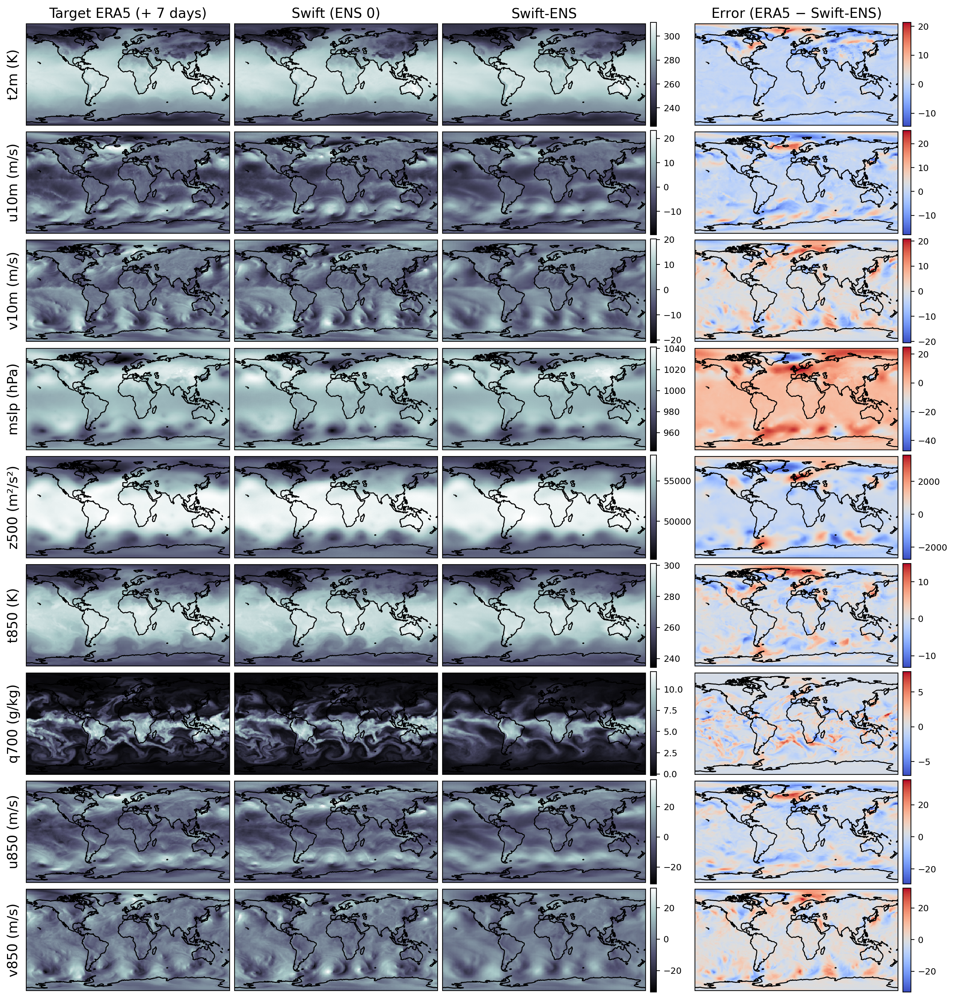

In [461]:
truth_ds = xr.open_zarr('/home/jstock/sf/data/wb2/1.40625deg_6hr_test.zarr')
ds = xr.open_zarr(
    "/home/jstock/sf/prod/swift/results/era5-swinv2-1.4-scm/011/output/checkpoint-020000/"
    # "output-64i-60s-12m-6h.zarr", 
    "output-32i-75s-12m-24h.zarr",
    decode_timedelta=True, mask_and_scale=False
)
lats, lons = ds.latitude.values, ds.longitude.values

variables = {
    't2m (K)': {'key': '2m_temperature'},
    'u10m (m/s)': {'key': '10m_u_component_of_wind'},
    'v10m (m/s)': {'key': '10m_v_component_of_wind'},
    'mslp (hPa)': {'key': 'mean_sea_level_pressure', 'scale': 0.01},
    'z500 (m²/s²)': {'key': 'geopotential', 'level': 7},
    't850 (K)': {'key': 'temperature', 'level': 10},
    'q700 (g/kg)': {'key': 'specific_humidity', 'level': 9, 'scale': 1000},
    'u850 (m/s)': {'key': 'u_component_of_wind', 'level': 10},
    'v850 (m/s)': {'key': 'v_component_of_wind', 'level': 10}
}

day = 7
fontsize = 12
time = ds.time[0]

fig = plt.figure(figsize=(16.3, 18))
gs = gridspec.GridSpec(len(variables), 7, figure=fig, 
                       width_ratios=[1, 1, 1, 0.03, 0.14, 1, 0.04],
                       wspace=0.04, hspace=0.04)

for row, (label, var) in enumerate(variables.items()):

    truth = truth_ds[var['key']].sel(time=time + np.timedelta64(day, 'D'))
    if 'level' in var:
        truth = truth.isel(level=var['level'])
    if 'scale' in var:
        truth = truth * var['scale']
    truth = truth.values

    data = ds[var['key']].sel(time=time).isel(number=0, prediction_timedelta=day) # 4*day
    if 'level' in var:
        data = data.isel(level=var['level'])
    if 'scale' in var:
        data = data * var['scale']
    data = data.values

    ens = ds[var['key']].sel(time=time).isel(prediction_timedelta=day) # 4*day
    if 'level' in var:
        ens = ens.isel(level=var['level'])
    if 'scale' in var:
        ens = ens * var['scale']
    ens = ens.mean(dim='number').values

    vmin = min(truth.min(), data.min(), ens.min())
    vmax = max(truth.max(), data.max(), ens.max())

    norm = mcolors.Normalize(vmin=vmin, vmax=vmax)

    # target
    ax = fig.add_subplot(gs[row, 0], projection=ccrs.PlateCarree())
    im = ax.pcolormesh(lons, lats, truth, cmap="bone",
                        transform=ccrs.PlateCarree(), norm=norm)
    ax.coastlines(color="black", linewidth=1)
    if row == 0:
        ax.set_title(f"Target ERA5 (+ {day} days)", fontsize=fontsize+2)

    ax.text(-0.03, 0.5, label, va="center", ha="right",
            rotation="vertical", fontsize=fontsize+2, transform=ax.transAxes)

    # prediction 
    ax = fig.add_subplot(gs[row, 1], projection=ccrs.PlateCarree())
    im = ax.pcolormesh(lons, lats, data, cmap="bone",
                        transform=ccrs.PlateCarree(), norm=norm)
    ax.coastlines(color="black", linewidth=1)
    if row == 0:
        ax.set_title(f"Swift (ENS 0)", fontsize=fontsize+2)

    # ens prediction
    ax = fig.add_subplot(gs[row, 2], projection=ccrs.PlateCarree())
    im = ax.pcolormesh(lons, lats, ens, cmap="bone",
                        transform=ccrs.PlateCarree(), norm=norm)
    ax.coastlines(color="black", linewidth=1)
    if row == 0:
        ax.set_title(f"Swift-ENS", fontsize=fontsize+2)

    cax = fig.add_subplot(gs[row, 3])
    cbar = fig.colorbar(im, cax=cax, orientation="vertical")
    cbar.ax.tick_params(labelsize=fontsize-3)

    # error
    error = truth - ens
    norm = mcolors.Normalize(vmin=error.min(), vmax=error.max())
    ax = fig.add_subplot(gs[row, 5], projection=ccrs.PlateCarree())
    im = ax.pcolormesh(lons, lats, error, cmap="coolwarm",
                        transform=ccrs.PlateCarree(), norm=norm)
    ax.coastlines(color="black", linewidth=1)
    if row == 0:
        ax.set_title(f"Error (ERA5 $-$ Swift-ENS)", fontsize=fontsize+2)

    cax = fig.add_subplot(gs[row, -1])
    cbar = fig.colorbar(im, cax=cax, orientation="vertical")
    cbar.ax.tick_params(labelsize=fontsize-3)

fig.savefig(f'samples_error_{str(time.values).split(":")[0]}_{day}d.png', dpi=300, bbox_inches='tight')

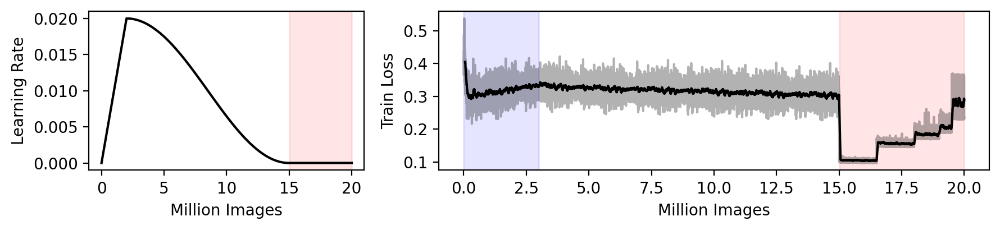

In [126]:
lr = pd.read_csv('wandb_export_swift_lr.csv')['machine: Aurora - train/lr']
loss = pd.read_csv('wandb_export_swift_loss.csv')['machine: Aurora - train/loss']
x = pd.read_csv('wandb_export_swift_lr.csv')['train/kimg'] / 1e3

fig = plt.figure(figsize=(9, 2.15))
gs = GridSpec(1, 2, width_ratios=[1, 2])

ax0 = fig.add_subplot(gs[0])
ax0.plot(x, lr, color='black')
ax0.set_xlabel('Million Images')
ax0.set_ylabel('Learning Rate')
ax0.axvspan(15, 20, color='red', alpha=0.1, zorder=0)

# ax0.text(15, 0.02, 'Pretraining',
#          color='black', fontsize=11,
#          rotation=90, va='top', ha='right')

# ax0.text(14.5, 0.02, 'Pretraining',
#          color='black', fontsize=11, va='top', ha='right')

# ax0.text(19.5, 0.02, 'Finetuning',
#          color='black', fontsize=11,
#          rotation=90, va='top', ha='right')


ax1 = fig.add_subplot(gs[1])
ax1.plot(x, loss, color='black', alpha=0.3)
ax1.plot(x, loss.rolling(window=50).mean(), color='k')
ax1.axvspan(0, 3, color='blue', alpha=0.1, zorder=0)
ax1.axvspan(15, 20, color='red', alpha=0.1, zorder=0)
# ax1.axvline(16.5, color='w', linestyle='-', alpha=1, zorder=1)
# ax1.axvline(18, color='w', linestyle='-', alpha=1, zorder=1)
# ax1.axvline(19, color='w', linestyle='-', alpha=1, zorder=1)
# ax1.axvline(19.5, color='w', linestyle='-', alpha=1, zorder=1)

ax1.set_xlabel('Million Images')
ax1.set_ylabel('Train Loss')

plt.tight_layout()

plt.savefig('lr_loss.png', dpi=300, bbox_inches='tight')

plt.show()

In [210]:
metrics = ['t2m', 'z500', 'q700']#, 'v850', 't850']
markers = ['o', 's', 'D', 'v', 'P']
# 24h errors
ifs = {
    't2m': 0.839946883202085,
    'z500': 45.78386135428877,
    'q700': 0.0006109093241827775,
    'v850': 1.242598335678423,
    't850': 0.7183816504442777
}
data = {
    'swift': {
        'metrics': {
            't2m': 0.6052037477493286,
            'z500': 48.594032287597656,
            'q700': 0.0005608923966065049,
            'v850': 1.212802767753601,
            't850': 0.6172180771827698
        },
        'x': 1,
        'color': 'red'
    },
    'arches': {
        'metrics': {
            't2m': 0.5414241424854422,
            'z500': 41.918222333151945,
            'q700': 0.0005183877150276809,
            'v850': 1.1895042507848734,
            't850': 0.5953138760854128
        },
        'x': 25,
        'color': 'black'
    },
    'gencast': {
        'metrics': {
            't2m': 0.49349650797863875,
            'z500': 39.3021178878644,
            'q700': 0.0004978601040006792,
            'v850': 1.0693364941096355,
            't850': 0.5416452480856092
        },
        'x': 39,
        'color': 'blue'
    },
    'diffusion': {
        'metrics': {
            't2m': 0.6114426255226135,
            'z500': 47.40731430053711,
            'q700': 0.0005576271214522421,
            'v850': 1.2162119150161743,
            't850': 0.6255002617835999
        },
        'x': 39,
        'color': 'darkturquoise'
    }
}

fig, ax = plt.subplots(1, 1, figsize=(3, 3))

for model, info in data.items():
    x = info['x']
    color = info['color']

    for i, var in enumerate(metrics):
        val = info['metrics'][var]
        rel_improvement = (ifs[var] - val) / ifs[var] * 100
        ax.scatter(x, rel_improvement, color=color, marker=markers[i], s=40)
        if model == 'swift':
            ax.text(x+2, rel_improvement, var, fontsize=10, ha='left', va='center')

    ax.text(x, 46, x, fontsize=10, ha='center', va='center')
    ax.axvline(x, color='black', linestyle='-', linewidth=1, zorder=0)

ax.axhline(0, color='black', linestyle='--')

ax.text(3, 23, 'Swift (Ours)', fontsize=9, ha='left', va='center', color='red', fontweight='bold',
        bbox=dict(facecolor='white', edgecolor='red', boxstyle='round,pad=0.3'))
ax.text(14.5, 33, 'Arches', fontsize=9, ha='left', va='center', color='black', fontweight='bold')
ax.text(27, 38, 'GenCast', fontsize=9, ha='left', va='center', color='blue', fontweight='bold')
ax.text(25.9, 23, 'Diffusion\n   (Ours)', fontsize=9, ha='left', va='center', color='darkturquoise', fontweight='bold')

ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.tick_params(top=False, right=False)

ax.set_ylabel("Improvement vs IFS ENS (%)")
ax.set_xlabel("Function Evaluations")
fig.tight_layout()

fig.savefig('24h_scaling.pdf', dpi=300, bbox_inches='tight')

plt.show()


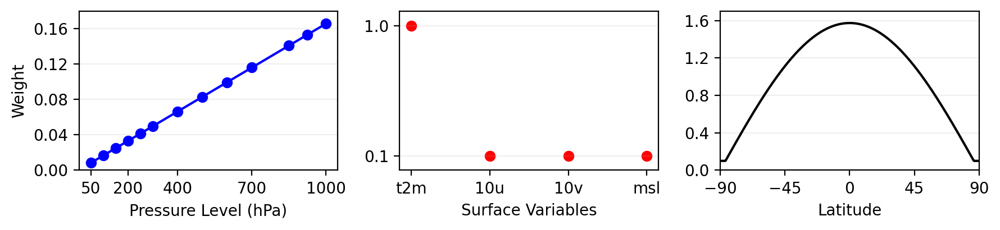

In [125]:
ACTUAL_VARIABLES = [
    "2m_temperature",
    "10m_u_component_of_wind",
    "10m_v_component_of_wind",
    "mean_sea_level_pressure",
    "geopotential_50",
    "geopotential_100",
    "geopotential_150",
    "geopotential_200",
    "geopotential_250",
    "geopotential_300",
    "geopotential_400",
    "geopotential_500",
    "geopotential_600",
    "geopotential_700",
    "geopotential_850",
    "geopotential_925",
    "geopotential_1000",
    "u_component_of_wind_50",
    "u_component_of_wind_100",
    "u_component_of_wind_150",
    "u_component_of_wind_200",
    "u_component_of_wind_250",
    "u_component_of_wind_300",
    "u_component_of_wind_400",
    "u_component_of_wind_500",
    "u_component_of_wind_600",
    "u_component_of_wind_700",
    "u_component_of_wind_850",
    "u_component_of_wind_925",
    "u_component_of_wind_1000",
    "v_component_of_wind_50",
    "v_component_of_wind_100",
    "v_component_of_wind_150",
    "v_component_of_wind_200",
    "v_component_of_wind_250",
    "v_component_of_wind_300",
    "v_component_of_wind_400",
    "v_component_of_wind_500",
    "v_component_of_wind_600",
    "v_component_of_wind_700",
    "v_component_of_wind_850",
    "v_component_of_wind_925",
    "v_component_of_wind_1000",
    "temperature_50",
    "temperature_100",
    "temperature_150",
    "temperature_200",
    "temperature_250",
    "temperature_300",
    "temperature_400",
    "temperature_500",
    "temperature_600",
    "temperature_700",
    "temperature_850",
    "temperature_925",
    "temperature_1000",
    "specific_humidity_50",
    "specific_humidity_100",
    "specific_humidity_150",
    "specific_humidity_200",
    "specific_humidity_250",
    "specific_humidity_300",
    "specific_humidity_400",
    "specific_humidity_500",
    "specific_humidity_600",
    "specific_humidity_700",
    "specific_humidity_850",
    "specific_humidity_925",
    "specific_humidity_1000",
]

PRESSURE_LEVEL_VARS = [
    "geopotential",
    "u_component_of_wind",
    "v_component_of_wind",
    "vertical_velocity",
    "wind_speed",
    "temperature",
    "relative_humidity",
    "specific_humidity",
    "vorticity",
    "potential_vorticity",
]

DEFAULT_PRESSURE_LEVELS = [50, 100, 150, 200, 250, 300, 400, 500, 600, 700, 850, 925, 1000]

# Pressure-level weights for training Stormer
single_level_weight_dict = {
    '2m_temperature': 1.0,
    # "sea_surface_temperature": 0.1,
    '10m_u_component_of_wind': 0.1,
    '10m_v_component_of_wind': 0.1,
    'mean_sea_level_pressure': 0.1,

}

pressure_weights = [l / sum(DEFAULT_PRESSURE_LEVELS) for l in DEFAULT_PRESSURE_LEVELS]
pressure_level_weight_dict = {}
for var in PRESSURE_LEVEL_VARS:
    for l, w in zip(DEFAULT_PRESSURE_LEVELS, pressure_weights):
        pressure_level_weight_dict[var + "_" + str(l)] = w

WEIGHT_DICT = {**single_level_weight_dict, **pressure_level_weight_dict}

ordered_weights = [WEIGHT_DICT[var] for var in ACTUAL_VARIABLES if var in WEIGHT_DICT]


def _calculate_latitude_weights(lat_dim: int) -> np.ndarray:
    w_lat = np.cos(np.deg2rad(np.linspace(-90, 90, lat_dim)))
    w_lat = w_lat / w_lat.mean()
    w_lat = np.clip(w_lat, a_min=0.1, a_max=float('inf'))
    return w_lat

lat_dim = 512
w_lat = _calculate_latitude_weights(lat_dim)
lats = np.linspace(-90, 90, lat_dim)


fig, axs = plt.subplots(1, 3, figsize=(9, 2.15))
axs[0].plot(DEFAULT_PRESSURE_LEVELS, pressure_weights, marker='o', color='b')
axs[0].set_xlabel('Pressure Level (hPa)')
axs[0].set_ylabel('Weight')
axs[0].set_ylim(0, 0.18)
axs[0].set_xticks(DEFAULT_PRESSURE_LEVELS[::3])
axs[0].yaxis.set_major_locator(plt.MaxNLocator(5))

axs[1].scatter(['t2m', '10u', '10v', 'msl'], single_level_weight_dict.values(), marker='o', color='r')
axs[1].set_xlabel('Surface Variables')

axs[2].plot(lats, w_lat, color='k')
axs[2].set_xlabel('Latitude')
axs[2].yaxis.set_major_locator(plt.MaxNLocator(5))

for ax in axs:
    ax.yaxis.grid(True, linestyle='-', alpha=0.2)

surface_vals = list(single_level_weight_dict.values())
ymin, ymax = min(surface_vals), max(surface_vals)
axs[1].set_ylim(ymin - 0.1, ymax + 0.1)
axs[1].set_yticks([ymin, ymax])

axs[2].set_ylim(0, 1.7)
axs[2].set_xlim(-90, 90)
axs[2].set_xticks([-90, -45, 0, 45, 90])

plt.tight_layout()
# fig.savefig('loss_weights.png', dpi=300)
plt.show()

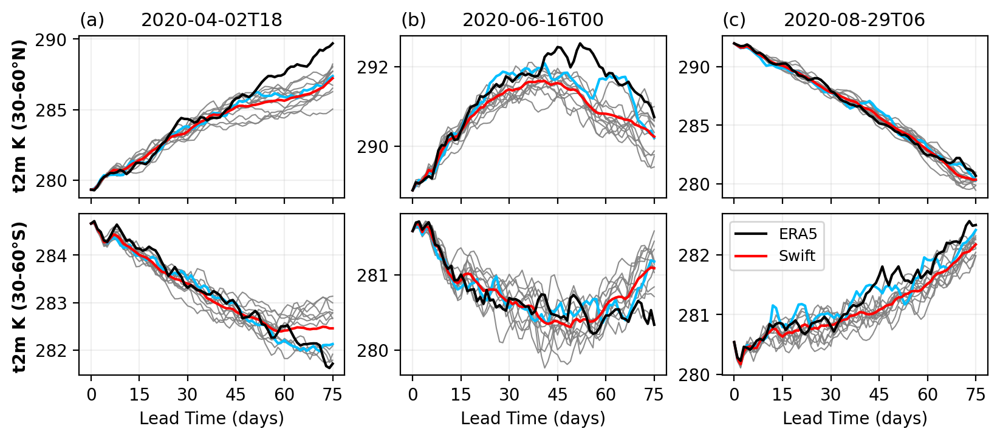

In [60]:
ds = xr.open_zarr(
    '/home/jstock/sf/prod/swift/results/era5-swinv2-1.4-scm'
    '/011/output/checkpoint-020000/output-32i-75s-12m-24h.zarr',
    decode_timedelta=False, mask_and_scale=False
)
truth_ds = xr.open_zarr('/home/jstock/sf/data/wb2/1.40625deg_6hr_test.zarr')

latitude = slice(30, 60)
longitude = slice(0, 360)

fig = plt.figure(figsize=(8, 3.25))
gs = GridSpec(
    2, 3, figure=fig,
    height_ratios=[1, 1],
    hspace=0.1, wspace=0.21
)
axs = np.array([[fig.add_subplot(gs[r, c]) for c in range(3)] for r in range(2)]).flatten()

coordinates = [
    {
        'latitude': slice(30, 60),
        'longitude': slice(0, 360)
    },
    {
        'latitude': slice(-60, -30),
        'longitude': slice(0, 360)
    },
]

for r, coord in enumerate(coordinates):
    for c, t in enumerate([10, 18, 26]):
        time = ds.time[t]
        ax = axs[r * 3 + c]

        data = ds['2m_temperature'].sel(time=time, **coord).mean(dim=["latitude", "longitude"]).values
        truth = truth_ds['2m_temperature'].sel(time=slice(time, time + np.timedelta64(75, 'D'), 4), 
                                            **coord).mean(dim=["latitude", "longitude"])

        ax.plot(truth.T, c='black', label='ERA5', zorder=5, lw=1.5)
        ax.plot(data.T, c='gray', alpha=0.9, lw=0.75)

        idx, minimum = -1, 1e10
        for i, m in enumerate(data):
            rmse = np.sqrt(np.mean(((m - truth.values) ** 2)))
            if rmse < minimum:
                minimum = rmse
                idx = i
        ax.plot(data[idx], c='deepskyblue', lw=1.5)

        ax.plot(data.mean(axis=0), c='red', label='Swift', lw=1.5)

        if r == 0:
            ax.set_title(f"{str(time.values).split(':')[0]}", fontsize=11)
            ax.set_title(f"({chr(97 + c)})", loc='left', fontsize=11)
        if r == 1:
            ax.set_xlabel('Lead Time (days)')

        ax.grid(alpha=0.2)

# tidy x-ticks and labels
for ax in axs:
    ax.xaxis.set_major_locator(tck.MultipleLocator(15))
    ax.xaxis.set_major_formatter(tck.FuncFormatter(lambda x, pos: f"{int(x)}"))
    ax.yaxis.set_major_formatter(tck.FuncFormatter(lambda y, pos: f"{int(y)}"))

for i, ax in enumerate(axs[:3]):
    ax.tick_params(labelbottom=False)

fig.text(-0.00, 0.74, 't2m K (30-60°N)',
         rotation=90, va='center', ha='center', fontsize=10, weight='bold')
fig.text(-0.00, 0.28, 't2m K (30-60°S)',
         rotation=90, va='center', ha='center', fontsize=10, weight='bold')

axs[-1].legend(loc='upper left', fontsize=9)

fig.subplots_adjust(left=0.06, right=0.995, top=0.94, bottom=0.08)

plt.savefig('t2m_seasonality.png', dpi=300, bbox_inches='tight')